# Look at year 1979 output from daily and hourly average files

In [3]:
import numpy as np
import xarray as xr
import cartopy.crs as ccrs
import matplotlib.path as mpath
import matplotlib.pyplot as plt
import cmocean

#### Functions

In [89]:
def plot_atm(var1, var2, title1, title2, vmin=0, vmax=400, cmap=cmocean.cm.haline):

    fig, ax = plt.subplots(1,2, figsize=(14,7), subplot_kw={'projection': ccrs.SouthPolarStereo()}, dpi=400)
    
    for axis in ax.ravel():
        axis.set_extent([-180, 180, -90, -50], ccrs.PlateCarree())
        axis.set_boundary(map_circle, transform=axis.transAxes)
        gl = axis.gridlines(draw_labels=True, ylocs=[]);
            
    ax[0].set_title(title1)
    ax[1].set_title(title2)
            
    # Separated bathymetries:
    kwags={'transform':ccrs.PlateCarree(), 'vmin':vmin, 'vmax':vmax, 'cmap':cmap, 'rasterized':True}
    cm1 = ax[0].pcolormesh(var1.longitude, var1.latitude, var1.values, **kwags);
    cm2 = ax[1].pcolormesh(var2.longitude, var2.latitude, var2.values, **kwags);
    try:
        CB1 = fig.colorbar(cm1, ax=ax[0], fraction=0.04, label=var1.units)
    except:
        CB1 = fig.colorbar(cm1, ax=ax[0], fraction=0.04)

    try:
        CB2 = fig.colorbar(cm2, ax=ax[1], fraction=0.04, label=var2.units)
    except:
        CB2 = fig.colorbar(cm2, ax=ax[1], fraction=0.04)

    return

In [8]:
theta = np.linspace(0, 2*np.pi, 100)
map_circle = mpath.Path(np.vstack([np.sin(theta), np.cos(theta)]).T * 0.5 + [0.5, 0.5])

In [9]:
TERRA = '/gws/nopw/j04/terrafirma/birgal/NEMO_AIS/'

In [78]:
folder_ERA  = '/gws/nopw/j04/terrafirma/birgal/NEMO_AIS/ERA5-forcing/'
ERA_t2m_AB = xr.open_dataset(f'{folder_ERA}t2m_y1979m01.nc').isel(time=slice(0,24)).sel(latitude=slice(-50,-90)).mean(dim='time')
ERA_t2m_AB['t2m'].attrs = {"units": 'K'}
ERA_t2m_SU = xr.open_dataset(f'{folder_ERA}era5_t2m_1979_daily_averages.nc').isel(time=0).sel(latitude=slice(-50,-90))

ERA_d2m_AB = xr.open_dataset(f'{folder_ERA}d2m_y1979m01.nc').isel(time=slice(0,24)).sel(latitude=slice(-50,-90)).mean(dim='time')
ERA_d2m_AB['d2m'].attrs = {"units": 'K'}
ERA_d2m_SU = xr.open_dataset(f'{folder_ERA}era5_d2m_1979_daily_averages.nc').isel(time=0).sel(latitude=slice(-50,-90))

ERA_u10_AB = xr.open_dataset(f'{folder_ERA}u10_y1979m01.nc').isel(time=slice(0,24)).sel(latitude=slice(-50,-90)).mean(dim='time')
ERA_u10_AB['u10'].attrs = {"units": 'm s-1'}
ERA_u10_SU = xr.open_dataset(f'{folder_ERA}era5_u10_1979_daily_averages.nc').isel(time=0).sel(latitude=slice(-50,-90))

ERA_v10_AB = xr.open_dataset(f'{folder_ERA}v10_y1979m01.nc').isel(time=slice(0,24)).sel(latitude=slice(-50,-90)).mean(dim='time')
ERA_v10_AB['v10'].attrs = {"units": 'm s-1'}
ERA_v10_SU = xr.open_dataset(f'{folder_ERA}era5_v10_1979_daily_averages.nc').isel(time=0).sel(latitude=slice(-50,-90))

ERA_msl_AB = xr.open_dataset(f'{folder_ERA}msl_y1979m01.nc').isel(time=slice(0,24)).sel(latitude=slice(-50,-90)).mean(dim='time')
ERA_msl_AB['msl'].attrs = {"units": 'Pa'}
ERA_msl_SU = xr.open_dataset(f'{folder_ERA}era5_msl_1979_daily_averages.nc').isel(time=0).sel(latitude=slice(-50,-90))

ERA_msdwlwrf_AB = xr.open_dataset(f'{folder_ERA}msdwlwrf_y1979m01.nc').isel(time=slice(0,24)).sel(latitude=slice(-50,-90)).mean(dim='time')
ERA_msdwlwrf_AB['msdwlwrf'].attrs = {"units": 'W/m2'}
ERA_ssrd_SU = xr.open_dataset(f'{folder_ERA}era5_ssrd_1979_daily_averages.nc').isel(time=0).sel(latitude=slice(-50,-90))

ERA_msdwswrf_AB = xr.open_dataset(f'{folder_ERA}msdwswrf_y1979m01.nc').isel(time=slice(0,24)).sel(latitude=slice(-50,-90)).mean(dim='time')
ERA_msdwswrf_AB['msdwswrf'].attrs = {"units": 'W/m2'}
ERA_strd_SU = xr.open_dataset(f'{folder_ERA}era5_strd_1979_daily_averages.nc').isel(time=0).sel(latitude=slice(-50,-90))

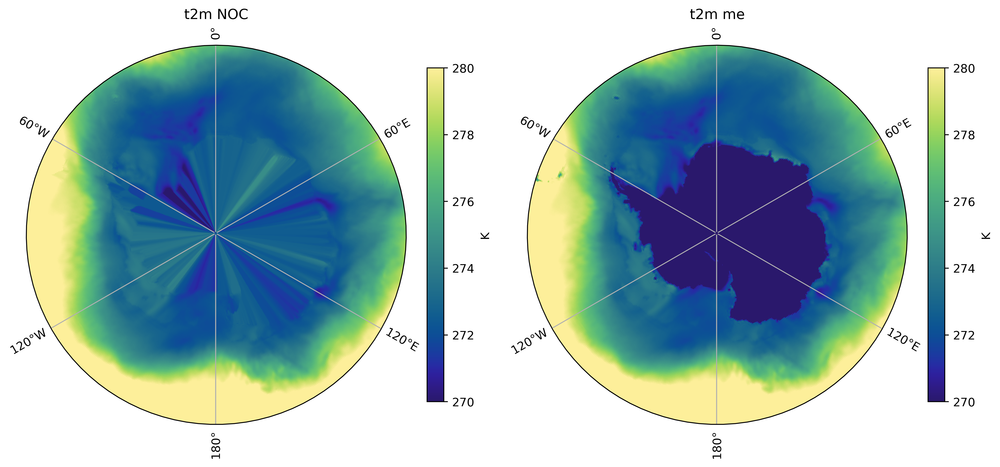

In [55]:
plot_atm(ERA_t2m_AB.t2m, ERA_t2m_SU.t2m, 't2m NOC', 't2m me', vmin=270, vmax=280)

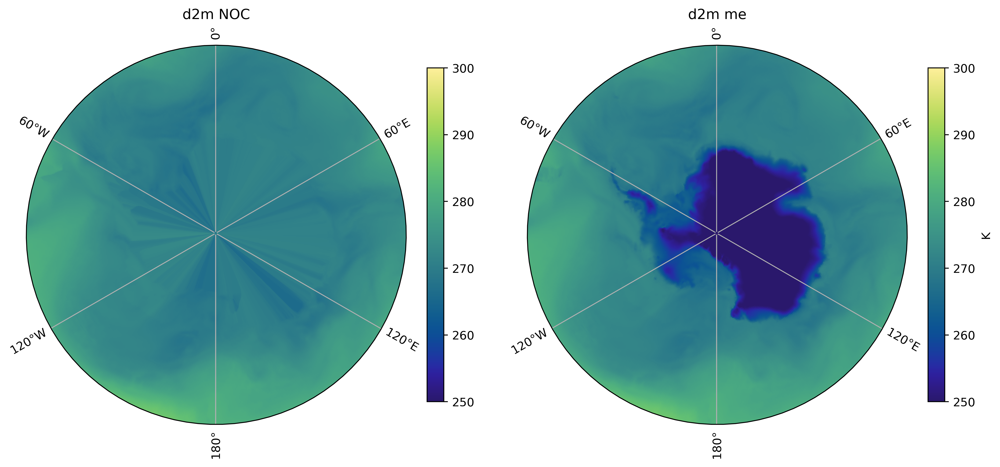

In [63]:
plot_atm(ERA_d2m_AB.d2m, ERA_d2m_SU.d2m, 'd2m NOC', 'd2m me', vmin=250, vmax=300)

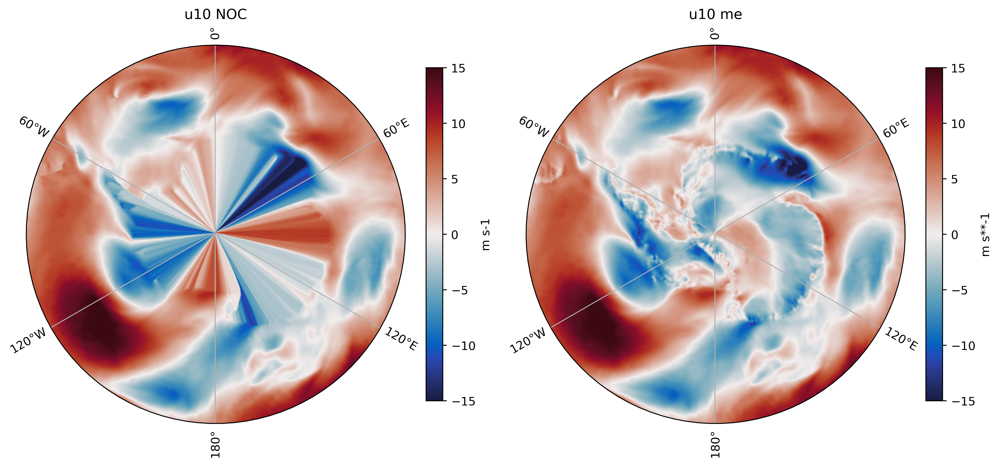

In [65]:
plot_atm(ERA_u10_AB.u10, ERA_u10_SU.u10, 'u10 NOC', 'u10 me', vmin=-15, vmax=15, cmap=cmocean.cm.balance)

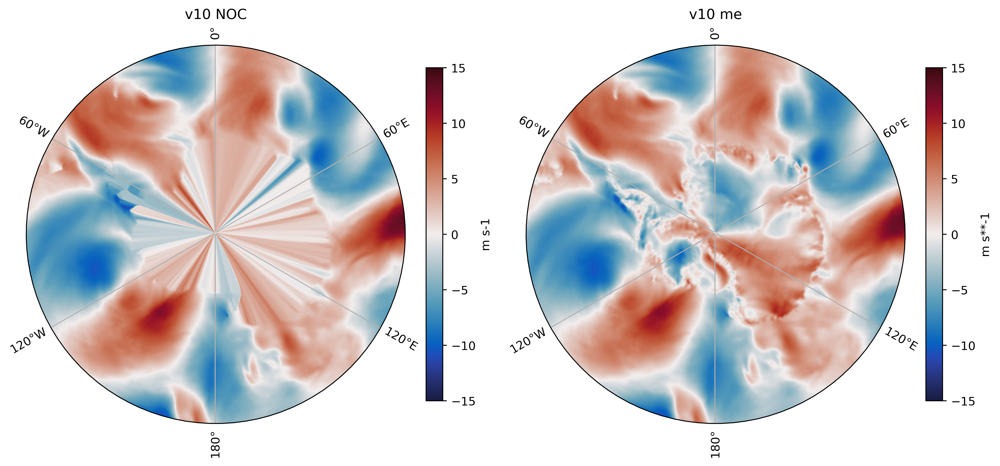

In [66]:
plot_atm(ERA_v10_AB.v10, ERA_v10_SU.v10, 'v10 NOC', 'v10 me', vmin=-15, vmax=15, cmap=cmocean.cm.balance)

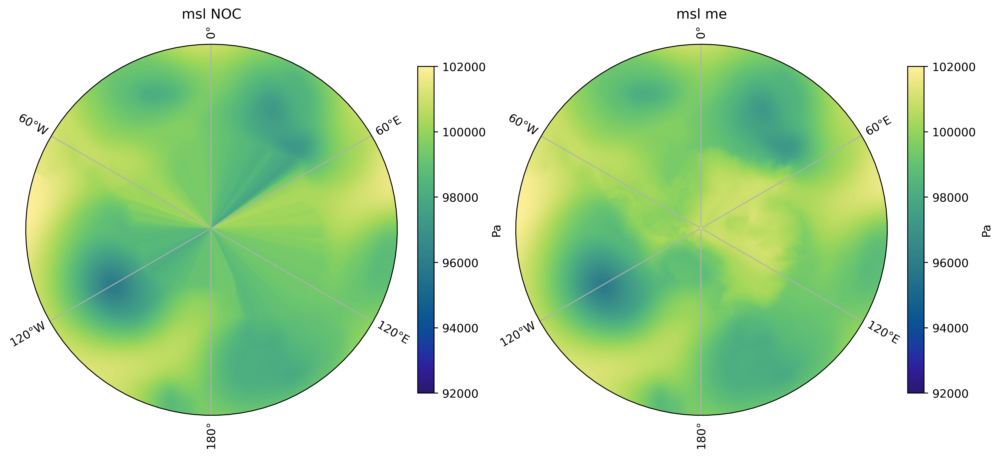

In [70]:
plot_atm(ERA_msl_AB.msl, ERA_msl_SU.msl, 'msl NOC', 'msl me', vmin=92000, vmax=102000)

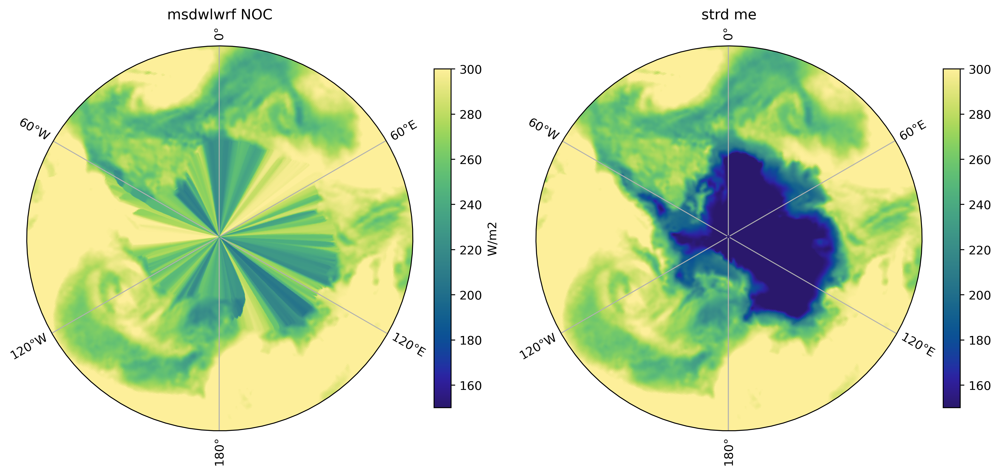

In [90]:
plot_atm(ERA_msdwlwrf_AB.msdwlwrf, ERA_strd_SU.strd / 3600, 'msdwlwrf NOC', 'strd me', vmin=150, vmax=300)

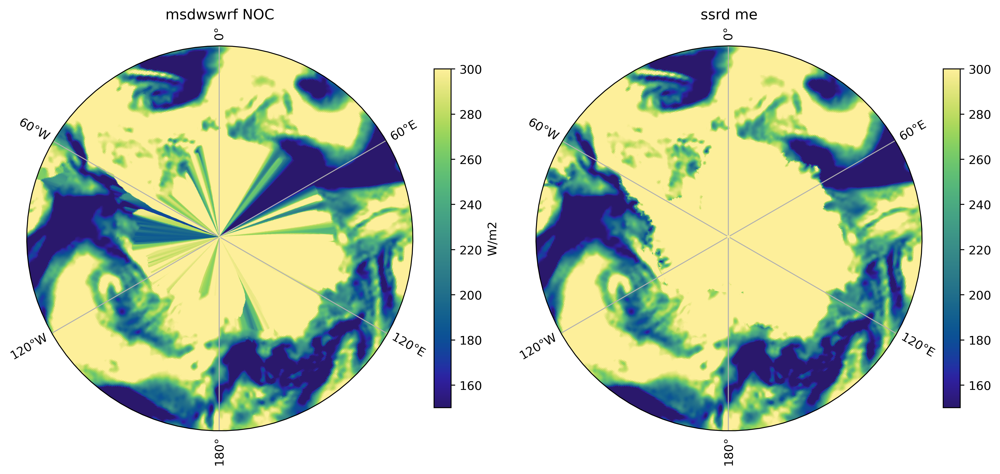

In [91]:
plot_atm(ERA_msdwswrf_AB.msdwswrf, ERA_ssrd_SU.ssrd / 3600, 'msdwswrf NOC', 'ssrd me', vmin=150, vmax=300)